In [780]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso,Ridge,ElasticNet
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.model_selection import cross_val_score,GridSearchCV
import warnings
warnings.filterwarnings('ignore')

In [673]:
pd.set_option('display.max_rows',None)

In [674]:
data_train=pd.read_excel("C:/Users/SRISTI/Desktop/practice text doc/flight_Data_Train.xlsx")
data_train

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302
5,SpiceJet,24/06/2019,Kolkata,Banglore,CCU → BLR,09:00,11:25,2h 25m,non-stop,No info,3873
6,Jet Airways,12/03/2019,Banglore,New Delhi,BLR → BOM → DEL,18:55,10:25 13 Mar,15h 30m,1 stop,In-flight meal not included,11087
7,Jet Airways,01/03/2019,Banglore,New Delhi,BLR → BOM → DEL,08:00,05:05 02 Mar,21h 5m,1 stop,No info,22270
8,Jet Airways,12/03/2019,Banglore,New Delhi,BLR → BOM → DEL,08:55,10:25 13 Mar,25h 30m,1 stop,In-flight meal not included,11087
9,Multiple carriers,27/05/2019,Delhi,Cochin,DEL → BOM → COK,11:25,19:15,7h 50m,1 stop,No info,8625


In [675]:
data_test=pd.read_excel("C:/Users/SRISTI/Desktop/practice text doc/flight_Test_set.xlsx")
data_test

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info
0,Jet Airways,6/06/2019,Delhi,Cochin,DEL → BOM → COK,17:30,04:25 07 Jun,10h 55m,1 stop,No info
1,IndiGo,12/05/2019,Kolkata,Banglore,CCU → MAA → BLR,06:20,10:20,4h,1 stop,No info
2,Jet Airways,21/05/2019,Delhi,Cochin,DEL → BOM → COK,19:15,19:00 22 May,23h 45m,1 stop,In-flight meal not included
3,Multiple carriers,21/05/2019,Delhi,Cochin,DEL → BOM → COK,08:00,21:00,13h,1 stop,No info
4,Air Asia,24/06/2019,Banglore,Delhi,BLR → DEL,23:55,02:45 25 Jun,2h 50m,non-stop,No info
5,Jet Airways,12/06/2019,Delhi,Cochin,DEL → BOM → COK,18:15,12:35 13 Jun,18h 20m,1 stop,In-flight meal not included
6,Air India,12/03/2019,Banglore,New Delhi,BLR → TRV → DEL,07:30,22:35,15h 5m,1 stop,No info
7,IndiGo,1/05/2019,Kolkata,Banglore,CCU → HYD → BLR,15:15,20:30,5h 15m,1 stop,No info
8,IndiGo,15/03/2019,Kolkata,Banglore,CCU → BLR,10:10,12:55,2h 45m,non-stop,No info
9,Jet Airways,18/05/2019,Kolkata,Banglore,CCU → BOM → BLR,16:30,22:35,6h 5m,1 stop,No info


There is a column named Additional_info that is not very useful as we can see most of rows have no info and whatever the info column has that does not matter, So we can drop it now from both dataset.

In [676]:
ds_train=data_train.copy()
ds_test=data_test.copy()

In [677]:
ds_train.drop('Additional_Info',axis=1,inplace=True)
ds_test.drop('Additional_Info',axis=1,inplace=True)

### EDA

In [678]:
ds_train.shape

(10683, 10)

In [679]:
ds_test.shape

(2671, 9)

train dataset has 10683 rows and 10 columns.
test dataset has 2671 rows and 9 columns.

In [680]:
ds_train.columns

Index(['Airline', 'Date_of_Journey', 'Source', 'Destination', 'Route',
       'Dep_Time', 'Arrival_Time', 'Duration', 'Total_Stops', 'Price'],
      dtype='object')

In [681]:
ds_test.columns

Index(['Airline', 'Date_of_Journey', 'Source', 'Destination', 'Route',
       'Dep_Time', 'Arrival_Time', 'Duration', 'Total_Stops'],
      dtype='object')

In [682]:
ds_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10683 entries, 0 to 10682
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Airline          10683 non-null  object
 1   Date_of_Journey  10683 non-null  object
 2   Source           10683 non-null  object
 3   Destination      10683 non-null  object
 4   Route            10682 non-null  object
 5   Dep_Time         10683 non-null  object
 6   Arrival_Time     10683 non-null  object
 7   Duration         10683 non-null  object
 8   Total_Stops      10682 non-null  object
 9   Price            10683 non-null  int64 
dtypes: int64(1), object(9)
memory usage: 834.7+ KB


In [683]:
ds_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2671 entries, 0 to 2670
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Airline          2671 non-null   object
 1   Date_of_Journey  2671 non-null   object
 2   Source           2671 non-null   object
 3   Destination      2671 non-null   object
 4   Route            2671 non-null   object
 5   Dep_Time         2671 non-null   object
 6   Arrival_Time     2671 non-null   object
 7   Duration         2671 non-null   object
 8   Total_Stops      2671 non-null   object
dtypes: object(9)
memory usage: 187.9+ KB


In both dataset all the columns are object type except target column which is in train dataset.

In [684]:
ds_train.isnull().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              1
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        1
Price              0
dtype: int64

In [685]:
ds_test.isnull().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              0
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        0
dtype: int64

Train data have 2 null values in two columns. one null value in eachh column. Since the null value is only 2 therefore we can drop it easily instead of replacing.

In [686]:
# droping the null values.

dtn=ds_train.dropna()
dts=ds_test.dropna()

In [687]:
dtn.isnull().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              0
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        0
Price              0
dtype: int64

In [688]:
dts.isnull().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              0
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        0
dtype: int64

In [689]:
for i in dtn.columns:
    if dtn[i].dtypes=='object':
        print(i)
        print(dtn[i].unique())

Airline
['IndiGo' 'Air India' 'Jet Airways' 'SpiceJet' 'Multiple carriers' 'GoAir'
 'Vistara' 'Air Asia' 'Vistara Premium economy' 'Jet Airways Business'
 'Multiple carriers Premium economy' 'Trujet']
Date_of_Journey
['24/03/2019' '1/05/2019' '9/06/2019' '12/05/2019' '01/03/2019'
 '24/06/2019' '12/03/2019' '27/05/2019' '1/06/2019' '18/04/2019'
 '9/05/2019' '24/04/2019' '3/03/2019' '15/04/2019' '12/06/2019'
 '6/03/2019' '21/03/2019' '3/04/2019' '6/05/2019' '15/05/2019'
 '18/06/2019' '15/06/2019' '6/04/2019' '18/05/2019' '27/06/2019'
 '21/05/2019' '06/03/2019' '3/06/2019' '15/03/2019' '3/05/2019'
 '9/03/2019' '6/06/2019' '24/05/2019' '09/03/2019' '1/04/2019'
 '21/04/2019' '21/06/2019' '27/03/2019' '18/03/2019' '12/04/2019'
 '9/04/2019' '1/03/2019' '03/03/2019' '27/04/2019']
Source
['Banglore' 'Kolkata' 'Delhi' 'Chennai' 'Mumbai']
Destination
['New Delhi' 'Banglore' 'Cochin' 'Kolkata' 'Delhi' 'Hyderabad']
Route
['BLR → DEL' 'CCU → IXR → BBI → BLR' 'DEL → LKO → BOM → COK'
 'CCU → NAG → BLR

In [690]:
for i in dtn.columns:
    if dtn[i].dtypes=='object':
        print(i)
        print(dtn[i].nunique())

Airline
12
Date_of_Journey
44
Source
5
Destination
6
Route
128
Dep_Time
222
Arrival_Time
1343
Duration
368
Total_Stops
5


In [691]:
for i in dts.columns:
    if dts[i].dtypes=='object':
        print(i)
        print(dts[i].unique())

Airline
['Jet Airways' 'IndiGo' 'Multiple carriers' 'Air Asia' 'Air India'
 'Vistara' 'SpiceJet' 'Vistara Premium economy' 'GoAir'
 'Multiple carriers Premium economy' 'Jet Airways Business']
Date_of_Journey
['6/06/2019' '12/05/2019' '21/05/2019' '24/06/2019' '12/06/2019'
 '12/03/2019' '1/05/2019' '15/03/2019' '18/05/2019' '21/03/2019'
 '15/06/2019' '15/05/2019' '3/06/2019' '06/03/2019' '24/03/2019'
 '6/03/2019' '9/05/2019' '18/03/2019' '6/04/2019' '1/06/2019' '3/03/2019'
 '27/03/2019' '9/06/2019' '3/05/2019' '1/04/2019' '18/06/2019'
 '15/04/2019' '6/05/2019' '9/03/2019' '3/04/2019' '27/06/2019'
 '21/06/2019' '21/04/2019' '18/04/2019' '9/04/2019' '24/05/2019'
 '01/03/2019' '09/03/2019' '27/05/2019' '03/03/2019' '27/04/2019'
 '1/03/2019' '24/04/2019' '12/04/2019']
Source
['Delhi' 'Kolkata' 'Banglore' 'Mumbai' 'Chennai']
Destination
['Cochin' 'Banglore' 'Delhi' 'New Delhi' 'Hyderabad' 'Kolkata']
Route
['DEL → BOM → COK' 'CCU → MAA → BLR' 'BLR → DEL' 'BLR → TRV → DEL'
 'CCU → HYD → BLR' '

In [692]:
for i in dts.columns:
    if dts[i].dtypes=='object':
        print(i)
        print(dts[i].nunique())

Airline
11
Date_of_Journey
44
Source
5
Destination
6
Route
100
Dep_Time
199
Arrival_Time
704
Duration
320
Total_Stops
5


In [693]:
dtn.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,13302


In [694]:
# converting date of journey column into datetime type from object type.

dtn['Date_of_Journey']=pd.to_datetime(dtn['Date_of_Journey'])
dts['Date_of_Journey']=pd.to_datetime(dts['Date_of_Journey'])

In [695]:
# extracting date and monthh from this column.
dtn['Month']=dtn['Date_of_Journey'].apply(lambda x:x.month)
dtn['Day']=dtn['Date_of_Journey'].apply(lambda x:x.day)

dts['Month']=dts['Date_of_Journey'].apply(lambda x:x.month)
dts['Day']=dts['Date_of_Journey'].apply(lambda x:x.day)

In [696]:
dtn.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Price,Month,Day
0,IndiGo,2019-03-24,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,3897,3,24
1,Air India,2019-01-05,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,7662,1,5
2,Jet Airways,2019-09-06,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,13882,9,6
3,IndiGo,2019-12-05,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,6218,12,5
4,IndiGo,2019-01-03,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,13302,1,3


In [697]:
dts.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Month,Day
0,Jet Airways,2019-06-06,Delhi,Cochin,DEL → BOM → COK,17:30,04:25 07 Jun,10h 55m,1 stop,6,6
1,IndiGo,2019-12-05,Kolkata,Banglore,CCU → MAA → BLR,06:20,10:20,4h,1 stop,12,5
2,Jet Airways,2019-05-21,Delhi,Cochin,DEL → BOM → COK,19:15,19:00 22 May,23h 45m,1 stop,5,21
3,Multiple carriers,2019-05-21,Delhi,Cochin,DEL → BOM → COK,08:00,21:00,13h,1 stop,5,21
4,Air Asia,2019-06-24,Banglore,Delhi,BLR → DEL,23:55,02:45 25 Jun,2h 50m,non-stop,6,24


In [698]:
# We extracted the date from the column dat eof journey now, we can drop this column.

dtn.drop('Date_of_Journey',axis=1,inplace=True)
dts.drop('Date_of_Journey',axis=1,inplace=True)

### Univariate Analysis

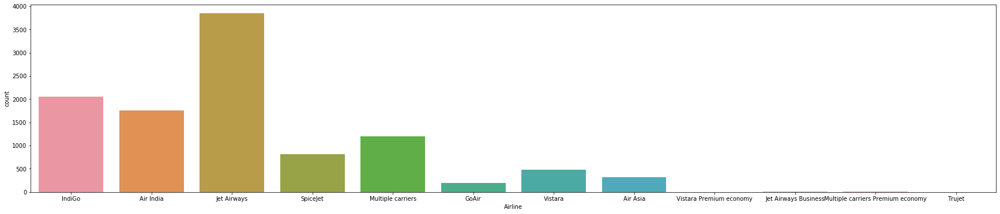

In [699]:
plt.figure(figsize=(30,6))
sns.countplot(dtn['Airline'])

In [700]:
dtn.Airline.value_counts()

Jet Airways                          3849
IndiGo                               2053
Air India                            1751
Multiple carriers                    1196
SpiceJet                              818
Vistara                               479
Air Asia                              319
GoAir                                 194
Multiple carriers Premium economy      13
Jet Airways Business                    6
Vistara Premium economy                 3
Trujet                                  1
Name: Airline, dtype: int64

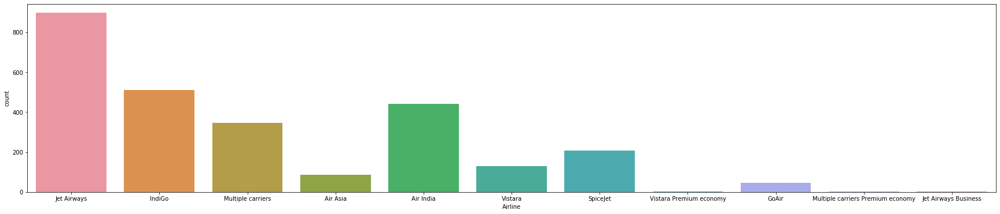

In [701]:
plt.figure(figsize=(30,6))
sns.countplot(dts['Airline'])

In [702]:
dts.Airline.value_counts()

Jet Airways                          897
IndiGo                               511
Air India                            440
Multiple carriers                    347
SpiceJet                             208
Vistara                              129
Air Asia                              86
GoAir                                 46
Multiple carriers Premium economy      3
Jet Airways Business                   2
Vistara Premium economy                2
Name: Airline, dtype: int64

Jet airways are highest in count in both dataset, but in train data trujet has only one count while in test data it is not present. Either we can drop this airline or keep it, according to requirement.

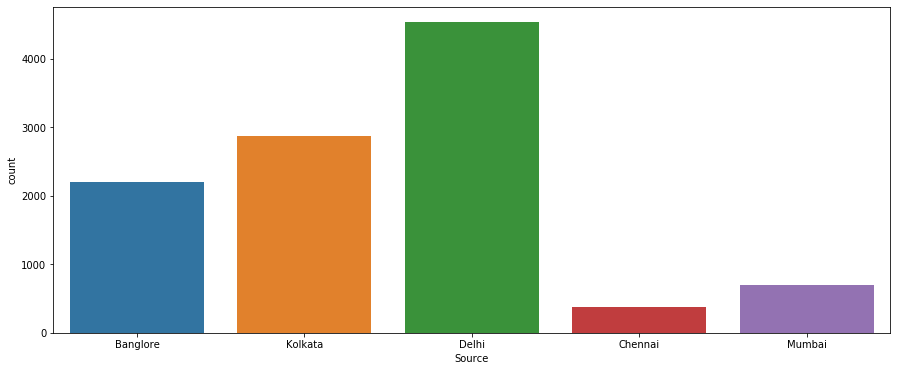

In [703]:
plt.figure(figsize=(15,6))
sns.countplot(dtn['Source'])

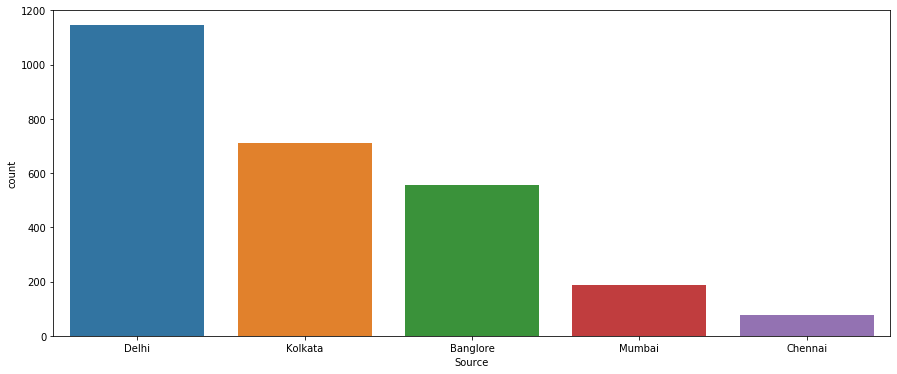

In [704]:
plt.figure(figsize=(15,6))
sns.countplot(dts['Source'])

In both the dataset, source column have delhi as highest count and chennai as least count.

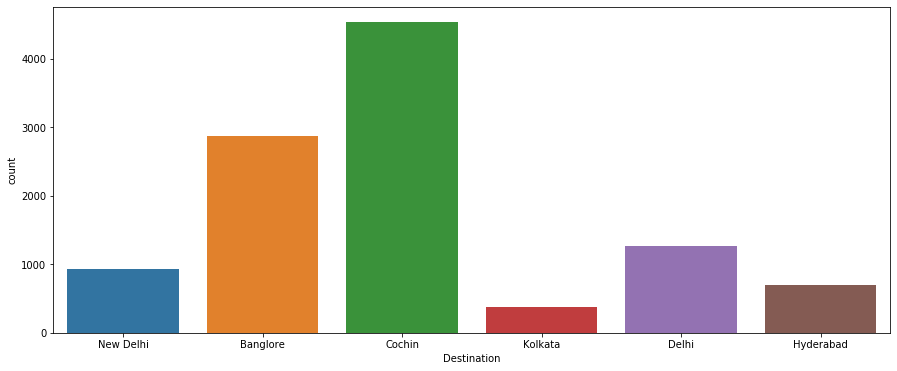

In [705]:
plt.figure(figsize=(15,6))
sns.countplot(dtn['Destination'])

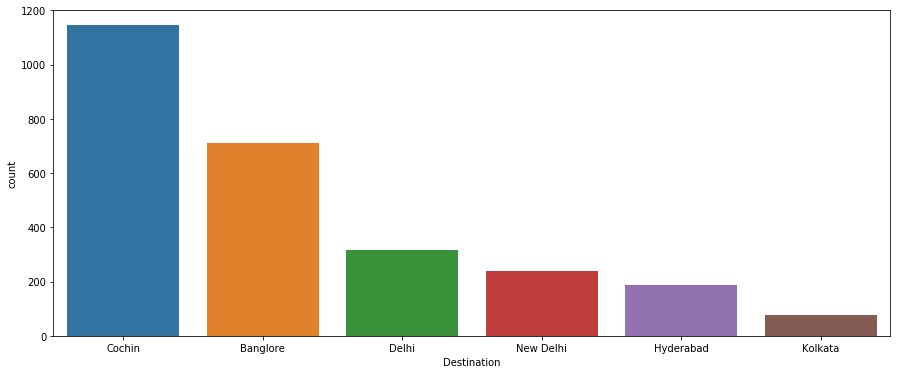

In [706]:
plt.figure(figsize=(15,6))
sns.countplot(dts['Destination'])

In both the dataset, destination column have cochin as highest count and kolkata as least count.

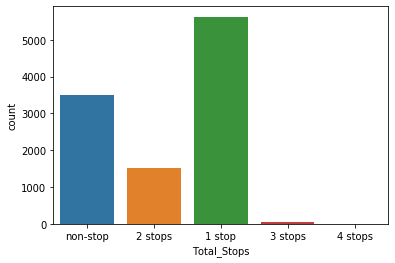

In [707]:
sns.countplot(dtn['Total_Stops'])

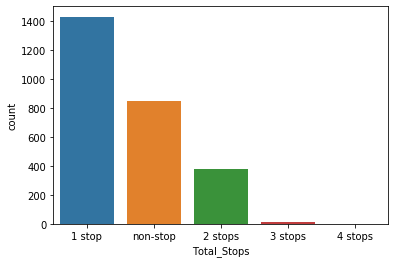

In [708]:
sns.countplot(dts['Total_Stops'])

In [709]:
dtn.Total_Stops.value_counts()

1 stop      5625
non-stop    3491
2 stops     1520
3 stops       45
4 stops        1
Name: Total_Stops, dtype: int64

In [710]:
dts.Total_Stops.value_counts()

1 stop      1431
non-stop     849
2 stops      379
3 stops       11
4 stops        1
Name: Total_Stops, dtype: int64

In both the dataset, total stops column have 1 stops as highest count and 4 stops as least count.

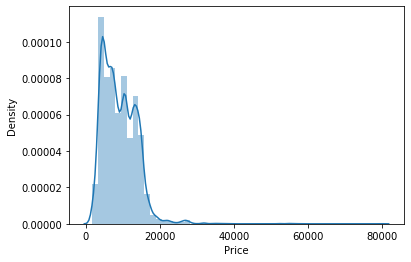

In [711]:
sns.distplot(dtn['Price'])

Mainly price is in between 0 to 40000 after that it becomes almost zero, we have to remove that part so that price column could not contain any unneccesary data. 

In [712]:
# We replace it with its median value.
dtn['Price']=np.where(dtn['Price']>=40000,dtn['Price'].median(),dtn['Price'])

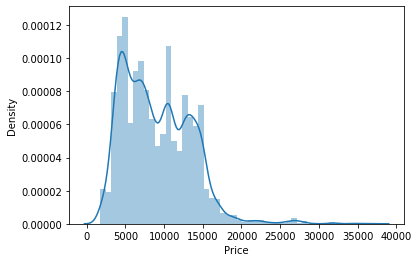

In [713]:
sns.distplot(dtn['Price'])

Now, it look quite okay.

### Bivariate Analysis

In [714]:
dtn.columns

Index(['Airline', 'Source', 'Destination', 'Route', 'Dep_Time', 'Arrival_Time',
       'Duration', 'Total_Stops', 'Price', 'Month', 'Day'],
      dtype='object')

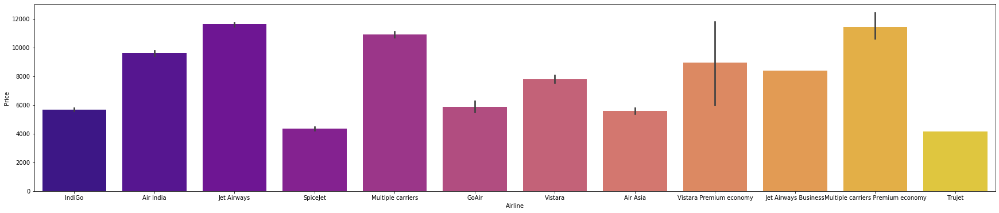

In [715]:
plt.figure(figsize=(30,6))
sns.barplot(x='Airline',y='Price',data=dtn,palette='plasma')

jet airways,vistara premium economy and multiple carriers premium economy has highest price among all.

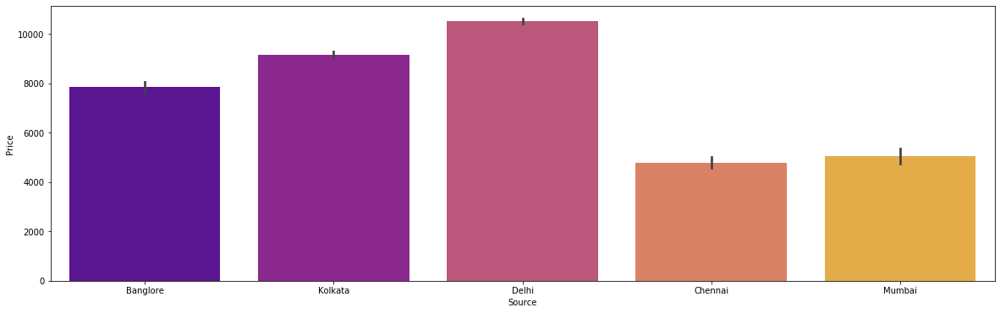

In [716]:
plt.figure(figsize=(20,6))
sns.barplot(x='Source',y='Price',data=dtn,palette='plasma')

Among all the sources delhi has highest price.

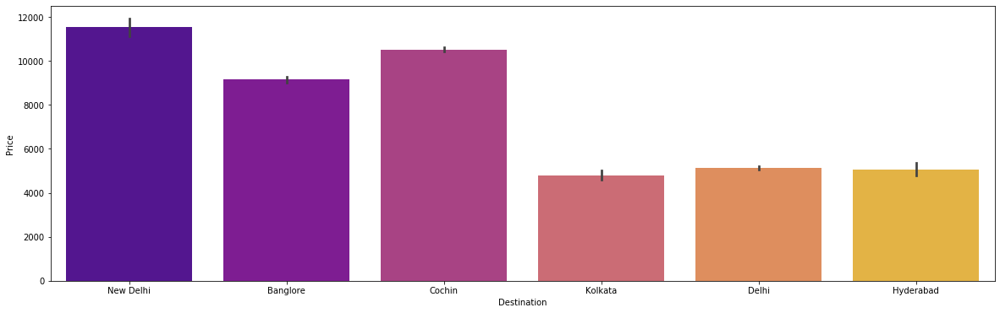

In [717]:
plt.figure(figsize=(20,6))
sns.barplot(x='Destination',y='Price',data=dtn,palette='plasma')

Among all destination city delhi has highest price.

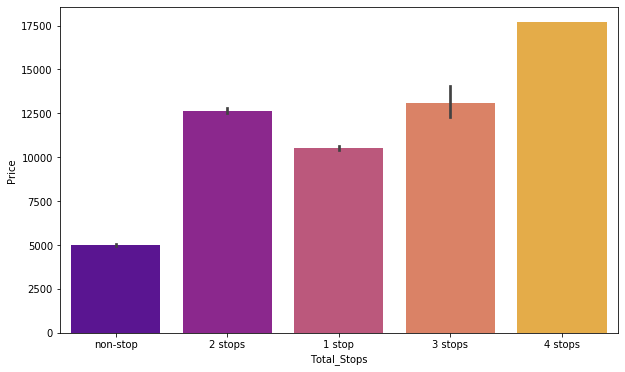

In [718]:
plt.figure(figsize=(10,6))
sns.barplot(x='Total_Stops',y='Price',data=dtn,palette='plasma')

More no. of stops between source and destination more the price.

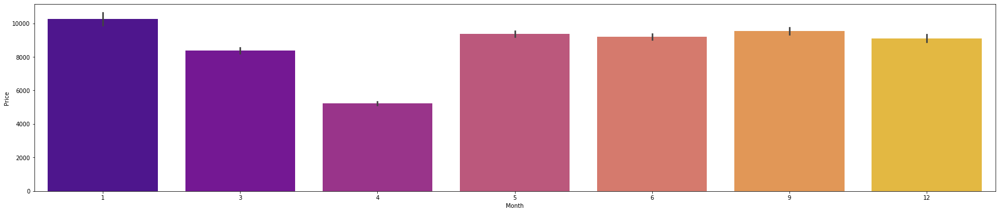

In [719]:
plt.figure(figsize=(30,6))
sns.barplot(x='Month',y='Price',data=dtn,palette='plasma')

On the month of january, may, june and october has highest price among all the months

In [720]:
dtn.head()

,Airline,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Price,Month,Day
0,IndiGo,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,3897.0,3,24
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,7662.0,1,5
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,13882.0,9,6
3,IndiGo,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,6218.0,12,5
4,IndiGo,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,13302.0,1,3


In [721]:
dts.head()

,Airline,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Month,Day
0,Jet Airways,Delhi,Cochin,DEL → BOM → COK,17:30,04:25 07 Jun,10h 55m,1 stop,6,6
1,IndiGo,Kolkata,Banglore,CCU → MAA → BLR,06:20,10:20,4h,1 stop,12,5
2,Jet Airways,Delhi,Cochin,DEL → BOM → COK,19:15,19:00 22 May,23h 45m,1 stop,5,21
3,Multiple carriers,Delhi,Cochin,DEL → BOM → COK,08:00,21:00,13h,1 stop,5,21
4,Air Asia,Banglore,Delhi,BLR → DEL,23:55,02:45 25 Jun,2h 50m,non-stop,6,24


In [722]:
dtn.Route.value_counts()

DEL → BOM → COK                      2376
BLR → DEL                            1552
CCU → BOM → BLR                       979
CCU → BLR                             724
BOM → HYD                             621
CCU → DEL → BLR                       565
BLR → BOM → DEL                       402
MAA → CCU                             381
DEL → HYD → COK                       326
DEL → JAI → BOM → COK                 240
DEL → BLR → COK                       232
DEL → COK                             213
DEL → AMD → BOM → COK                 205
DEL → MAA → COK                       146
DEL → IDR → BOM → COK                  99
DEL → HYD → MAA → COK                  83
DEL → NAG → BOM → COK                  71
CCU → MAA → BLR                        65
DEL → GOI → BOM → COK                  58
DEL → HYD → BOM → COK                  56
CCU → HYD → BLR                        53
DEL → BHO → BOM → COK                  50
CCU → BBI → BLR                        50
CCU → IXR → DEL → BLR             

It has 5 stops, we have to spilt is according to that.

In [723]:
dts.Route.value_counts()

DEL → BOM → COK                      624
BLR → DEL                            389
CCU → BOM → BLR                      253
CCU → BLR                            172
BOM → HYD                            164
CCU → DEL → BLR                      124
BLR → BOM → DEL                      107
DEL → HYD → COK                       85
MAA → CCU                             75
DEL → JAI → BOM → COK                 74
DEL → BLR → COK                       55
DEL → COK                             49
DEL → MAA → COK                       44
DEL → AMD → BOM → COK                 41
CCU → HYD → BLR                       27
DEL → IDR → BOM → COK                 18
DEL → HYD → MAA → COK                 17
DEL → GOI → BOM → COK                 15
DEL → CCU → BOM → COK                 15
CCU → MAA → BLR                       13
DEL → HYD → BOM → COK                 12
DEL → NAG → BOM → COK                 12
CCU → DEL → COK → BLR                 12
CCU → BBI → BOM → BLR                 11
CCU → IXR → DEL 

test data also have 5 stops, its good because we can split both of them in same manner having same column size.

In [724]:
# extraction of different-2 routes. spliting with arrows.

dtn['Route1']=dtn['Route'].str.split('→').str[0]
dtn['Route2']=dtn['Route'].str.split('→').str[1]
dtn['Route3']=dtn['Route'].str.split('→').str[2]
dtn['Route4']=dtn['Route'].str.split('→').str[3]
dtn['Route5']=dtn['Route'].str.split('→').str[4]

In [725]:
dtn.head()

,Airline,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Price,Month,Day,Route1,Route2,Route3,Route4,Route5
0,IndiGo,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,3897.0,3,24,BLR,DEL,NaN,NaN,NaN
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,7662.0,1,5,CCU,IXR,BBI,BLR,NaN
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,13882.0,9,6,DEL,LKO,BOM,COK,NaN
3,IndiGo,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,6218.0,12,5,CCU,NAG,BLR,NaN,NaN
4,IndiGo,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,13302.0,1,3,BLR,NAG,DEL,NaN,NaN


In [726]:
dts['Route1']=dts['Route'].str.split('→').str[0]
dts['Route2']=dts['Route'].str.split('→').str[1]
dts['Route3']=dts['Route'].str.split('→').str[2]
dts['Route4']=dts['Route'].str.split('→').str[3]
dts['Route5']=dts['Route'].str.split('→').str[4]

In [727]:
dts.head()

,Airline,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Month,Day,Route1,Route2,Route3,Route4,Route5
0,Jet Airways,Delhi,Cochin,DEL → BOM → COK,17:30,04:25 07 Jun,10h 55m,1 stop,6,6,DEL,BOM,COK,NaN,NaN
1,IndiGo,Kolkata,Banglore,CCU → MAA → BLR,06:20,10:20,4h,1 stop,12,5,CCU,MAA,BLR,NaN,NaN
2,Jet Airways,Delhi,Cochin,DEL → BOM → COK,19:15,19:00 22 May,23h 45m,1 stop,5,21,DEL,BOM,COK,NaN,NaN
3,Multiple carriers,Delhi,Cochin,DEL → BOM → COK,08:00,21:00,13h,1 stop,5,21,DEL,BOM,COK,NaN,NaN
4,Air Asia,Banglore,Delhi,BLR → DEL,23:55,02:45 25 Jun,2h 50m,non-stop,6,24,BLR,DEL,NaN,NaN,NaN


In [728]:
# now we can drop the original route column.

dtn.drop('Route',axis=1,inplace=True)
dts.drop('Route',axis=1,inplace=True)

In [729]:
# converting dep_time and arrival_time into datetime and then extracting its hour and minute.

dtn['Dep_Time']=pd.to_datetime(dtn['Dep_Time'])
dtn['Arrival_Time']=pd.to_datetime(dtn['Arrival_Time'])

dts['Dep_Time']=pd.to_datetime(dts['Dep_Time'])
dts['Arrival_Time']=pd.to_datetime(dts['Arrival_Time'])

In [730]:
# extracting hour and minute from dep_time column from both dataset.

dtn['Dep_Time_hr']=dtn['Dep_Time'].dt.hour
dtn['Dep_Time_min']=dtn['Dep_Time'].dt.minute

dts['Dep_Time_hr']=dts['Dep_Time'].dt.hour
dts['Dep_Time_min']=dts['Dep_Time'].dt.minute

In [731]:
dtn.head(3)

,Airline,Source,Destination,Dep_Time,Arrival_Time,Duration,Total_Stops,Price,Month,Day,Route1,Route2,Route3,Route4,Route5,Dep_Time_hr,Dep_Time_min
0,IndiGo,Banglore,New Delhi,2021-06-17 22:20:00,2021-03-22 01:10:00,2h 50m,non-stop,3897.0,3,24,BLR,DEL,NaN,NaN,NaN,22,20
1,Air India,Kolkata,Banglore,2021-06-17 05:50:00,2021-06-17 13:15:00,7h 25m,2 stops,7662.0,1,5,CCU,IXR,BBI,BLR,NaN,5,50
2,Jet Airways,Delhi,Cochin,2021-06-17 09:25:00,2021-06-10 04:25:00,19h,2 stops,13882.0,9,6,DEL,LKO,BOM,COK,NaN,9,25


In [732]:
# extracting hour and minute from arrival_time column from both dataset.

dtn['Arrival_Time_hr']=dtn['Arrival_Time'].dt.hour
dtn['Arrival_Time_min']=dtn['Arrival_Time'].dt.minute

dts['Arrival_Time_hr']=dts['Arrival_Time'].dt.hour
dts['Arrival_Time_min']=dts['Arrival_Time'].dt.minute

In [733]:
dtn.head(3)

,Airline,Source,Destination,Dep_Time,Arrival_Time,Duration,Total_Stops,Price,Month,Day,Route1,Route2,Route3,Route4,Route5,Dep_Time_hr,Dep_Time_min,Arrival_Time_hr,Arrival_Time_min
0,IndiGo,Banglore,New Delhi,2021-06-17 22:20:00,2021-03-22 01:10:00,2h 50m,non-stop,3897.0,3,24,BLR,DEL,NaN,NaN,NaN,22,20,1,10
1,Air India,Kolkata,Banglore,2021-06-17 05:50:00,2021-06-17 13:15:00,7h 25m,2 stops,7662.0,1,5,CCU,IXR,BBI,BLR,NaN,5,50,13,15
2,Jet Airways,Delhi,Cochin,2021-06-17 09:25:00,2021-06-10 04:25:00,19h,2 stops,13882.0,9,6,DEL,LKO,BOM,COK,NaN,9,25,4,25


In [734]:
# droping original dep_time and arrival_time columns.

dtn.drop(columns=['Dep_Time','Arrival_Time'],axis=1,inplace=True)
dts.drop(columns=['Dep_Time','Arrival_Time'],axis=1,inplace=True)

In [735]:
dts.head()

,Airline,Source,Destination,Duration,Total_Stops,Month,Day,Route1,Route2,Route3,Route4,Route5,Dep_Time_hr,Dep_Time_min,Arrival_Time_hr,Arrival_Time_min
0,Jet Airways,Delhi,Cochin,10h 55m,1 stop,6,6,DEL,BOM,COK,NaN,NaN,17,30,4,25
1,IndiGo,Kolkata,Banglore,4h,1 stop,12,5,CCU,MAA,BLR,NaN,NaN,6,20,10,20
2,Jet Airways,Delhi,Cochin,23h 45m,1 stop,5,21,DEL,BOM,COK,NaN,NaN,19,15,19,0
3,Multiple carriers,Delhi,Cochin,13h,1 stop,5,21,DEL,BOM,COK,NaN,NaN,8,0,21,0
4,Air Asia,Banglore,Delhi,2h 50m,non-stop,6,24,BLR,DEL,NaN,NaN,NaN,23,55,2,45


In [736]:
# extracting time hour and min from duration columns.

dtn['Duration_hr']=(dtn['Duration'].str.split(' ').str[0])
dtn['Duration_min']=(dtn['Duration'].str.split(' ').str[1])

In [737]:
dtn.head()

,Airline,Source,Destination,Duration,Total_Stops,Price,Month,Day,Route1,Route2,Route3,Route4,Route5,Dep_Time_hr,Dep_Time_min,Arrival_Time_hr,Arrival_Time_min,Duration_hr,Duration_min
0,IndiGo,Banglore,New Delhi,2h 50m,non-stop,3897.0,3,24,BLR,DEL,NaN,NaN,NaN,22,20,1,10,2h,50m
1,Air India,Kolkata,Banglore,7h 25m,2 stops,7662.0,1,5,CCU,IXR,BBI,BLR,NaN,5,50,13,15,7h,25m
2,Jet Airways,Delhi,Cochin,19h,2 stops,13882.0,9,6,DEL,LKO,BOM,COK,NaN,9,25,4,25,19h,NaN
3,IndiGo,Kolkata,Banglore,5h 25m,1 stop,6218.0,12,5,CCU,NAG,BLR,NaN,NaN,18,5,23,30,5h,25m
4,IndiGo,Banglore,New Delhi,4h 45m,1 stop,13302.0,1,3,BLR,NAG,DEL,NaN,NaN,16,50,21,35,4h,45m


In [738]:
# removing the 'h' and 'm' word from the columns and convert it into float type.

dtn['Duration_hr']=dtn['Duration_hr'].str.slice(stop=-1).astype(float)
dtn['Duration_min']=dtn['Duration_min'].str.slice(stop=-1).astype(float)

In [739]:
dtn.head(3)

,Airline,Source,Destination,Duration,Total_Stops,Price,Month,Day,Route1,Route2,Route3,Route4,Route5,Dep_Time_hr,Dep_Time_min,Arrival_Time_hr,Arrival_Time_min,Duration_hr,Duration_min
0,IndiGo,Banglore,New Delhi,2h 50m,non-stop,3897.0,3,24,BLR,DEL,NaN,NaN,NaN,22,20,1,10,2.0,50.0
1,Air India,Kolkata,Banglore,7h 25m,2 stops,7662.0,1,5,CCU,IXR,BBI,BLR,NaN,5,50,13,15,7.0,25.0
2,Jet Airways,Delhi,Cochin,19h,2 stops,13882.0,9,6,DEL,LKO,BOM,COK,NaN,9,25,4,25,19.0,NaN


In [740]:
dts['Duration_hr']=(dts['Duration'].str.split(' ').str[0])
dts['Duration_min']=(dts['Duration'].str.split(' ').str[1])

In [741]:
dts['Duration_hr']=dts['Duration_hr'].str.slice(stop=-1).astype(float)
dts['Duration_min']=dts['Duration_min'].str.slice(stop=-1).astype(float)

In [742]:
dts.head()

,Airline,Source,Destination,Duration,Total_Stops,Month,Day,Route1,Route2,Route3,Route4,Route5,Dep_Time_hr,Dep_Time_min,Arrival_Time_hr,Arrival_Time_min,Duration_hr,Duration_min
0,Jet Airways,Delhi,Cochin,10h 55m,1 stop,6,6,DEL,BOM,COK,NaN,NaN,17,30,4,25,10.0,55.0
1,IndiGo,Kolkata,Banglore,4h,1 stop,12,5,CCU,MAA,BLR,NaN,NaN,6,20,10,20,4.0,NaN
2,Jet Airways,Delhi,Cochin,23h 45m,1 stop,5,21,DEL,BOM,COK,NaN,NaN,19,15,19,0,23.0,45.0
3,Multiple carriers,Delhi,Cochin,13h,1 stop,5,21,DEL,BOM,COK,NaN,NaN,8,0,21,0,13.0,NaN
4,Air Asia,Banglore,Delhi,2h 50m,non-stop,6,24,BLR,DEL,NaN,NaN,NaN,23,55,2,45,2.0,50.0


In [743]:
# removing duration column after extraction.

dtn.drop('Duration',axis=1,inplace=True)
dts.drop('Duration',axis=1,inplace=True)

for removing the nan value,in route column we can fill with the none, because if we try to fill with 0, then during encoding it can be problematic. and rest of the column can be filled by 0.

In [744]:
dtn.isnull().sum()

Airline                 0
Source                  0
Destination             0
Total_Stops             0
Price                   0
Month                   0
Day                     0
Route1                  0
Route2                  0
Route3               3491
Route4               9116
Route5              10636
Dep_Time_hr             0
Dep_Time_min            0
Arrival_Time_hr         0
Arrival_Time_min        0
Duration_hr             0
Duration_min         1032
dtype: int64

In [745]:
dts.isnull().sum()

Airline                0
Source                 0
Destination            0
Total_Stops            0
Month                  0
Day                    0
Route1                 0
Route2                 0
Route3               849
Route4              2280
Route5              2659
Dep_Time_hr            0
Dep_Time_min           0
Arrival_Time_hr        0
Arrival_Time_min       0
Duration_hr            0
Duration_min         254
dtype: int64

In [746]:
# filling the nan values(train_data)

dtn['Route3']=dtn['Route3'].fillna('none')
dtn['Route4']=dtn['Route4'].fillna('none')
dtn['Route5']=dtn['Route5'].fillna('none')

dtn['Duration_min']=dtn['Duration_min'].fillna('0').astype(float)

In [747]:
dtn.head()

,Airline,Source,Destination,Total_Stops,Price,Month,Day,Route1,Route2,Route3,Route4,Route5,Dep_Time_hr,Dep_Time_min,Arrival_Time_hr,Arrival_Time_min,Duration_hr,Duration_min
0,IndiGo,Banglore,New Delhi,non-stop,3897.0,3,24,BLR,DEL,none,none,none,22,20,1,10,2.0,50.0
1,Air India,Kolkata,Banglore,2 stops,7662.0,1,5,CCU,IXR,BBI,BLR,none,5,50,13,15,7.0,25.0
2,Jet Airways,Delhi,Cochin,2 stops,13882.0,9,6,DEL,LKO,BOM,COK,none,9,25,4,25,19.0,0.0
3,IndiGo,Kolkata,Banglore,1 stop,6218.0,12,5,CCU,NAG,BLR,none,none,18,5,23,30,5.0,25.0
4,IndiGo,Banglore,New Delhi,1 stop,13302.0,1,3,BLR,NAG,DEL,none,none,16,50,21,35,4.0,45.0


In [748]:
dtn.isnull().sum()

Airline             0
Source              0
Destination         0
Total_Stops         0
Price               0
Month               0
Day                 0
Route1              0
Route2              0
Route3              0
Route4              0
Route5              0
Dep_Time_hr         0
Dep_Time_min        0
Arrival_Time_hr     0
Arrival_Time_min    0
Duration_hr         0
Duration_min        0
dtype: int64

In [749]:
# filling the nan values(test_data)

dts['Route3']=dts['Route3'].fillna('none')
dts['Route4']=dts['Route4'].fillna('none')
dts['Route5']=dts['Route5'].fillna('none')

dts['Duration_min']=dts['Duration_min'].fillna('0').astype(float)

In [750]:
dts.isnull().sum()

Airline             0
Source              0
Destination         0
Total_Stops         0
Month               0
Day                 0
Route1              0
Route2              0
Route3              0
Route4              0
Route5              0
Dep_Time_hr         0
Dep_Time_min        0
Arrival_Time_hr     0
Arrival_Time_min    0
Duration_hr         0
Duration_min        0
dtype: int64

Here we can see that every column have been free from null values.
Now, columns are ready for encoding and further processing.

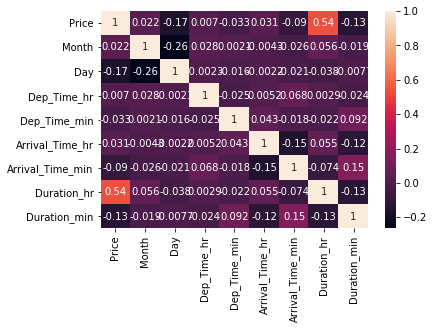

In [751]:
sns.heatmap(dtn.corr(),annot=True)

Duration_hr is very much correlated to target column.
Other than this rest columns do not influence much to target column.

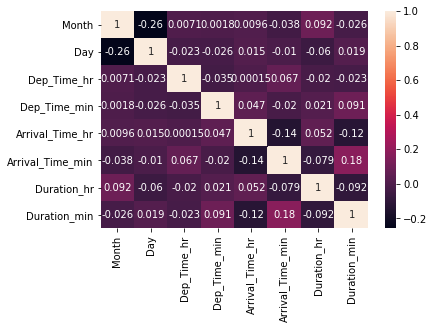

In [752]:
sns.heatmap(dts.corr(),annot=True)

There is no multicollinearity between columns.

In [753]:
dtn.describe()

,Price,Month,Day,Dep_Time_hr,Dep_Time_min,Arrival_Time_hr,Arrival_Time_min,Duration_hr,Duration_min
count,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000
mean,9046.090994,5.534731,12.682925,12.491013,24.409287,13.349186,24.690601,10.245366,28.326156
std,4387.489557,2.987626,8.803800,5.748820,18.767801,6.859317,16.506808,8.494489,16.946530
min,1759.000000,1.000000,3.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,5277.000000,3.000000,5.000000,8.000000,5.000000,8.000000,10.000000,2.000000,15.000000
50%,8372.000000,5.000000,6.000000,11.000000,25.000000,14.000000,25.000000,8.000000,30.000000
75%,12373.000000,6.000000,21.000000,18.000000,40.000000,19.000000,35.000000,15.000000,45.000000
max,36983.000000,12.000000,27.000000,23.000000,55.000000,23.000000,55.000000,47.000000,55.000000


Some columns have mean>>std and some have mean<std.
Some columns have 75% value<<max value,there may be outliers present in these columns.

In [754]:
dts.describe()

,Month,Day,Dep_Time_hr,Dep_Time_min,Arrival_Time_hr,Arrival_Time_min,Duration_hr,Duration_min
count,2671.000000,2671.000000,2671.000000,2671.000000,2671.000000,2671.000000,2671.000000,2671.000000
mean,5.607263,12.026956,12.603519,24.891426,13.585174,24.558218,10.190940,28.395732
std,3.042952,8.564408,5.686673,19.086522,7.040396,16.775436,8.388967,16.750546
min,1.000000,3.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,3.000000,5.000000,8.000000,5.000000,8.000000,10.000000,2.000000,15.000000
50%,5.000000,6.000000,12.000000,25.000000,15.000000,25.000000,8.000000,30.000000
75%,6.000000,21.000000,18.000000,45.000000,19.000000,35.000000,15.000000,45.000000
max,12.000000,27.000000,23.000000,55.000000,23.000000,55.000000,40.000000,55.000000


In [755]:
dtn.dtypes

Airline              object
Source               object
Destination          object
Total_Stops          object
Price               float64
Month                 int64
Day                   int64
Route1               object
Route2               object
Route3               object
Route4               object
Route5               object
Dep_Time_hr           int64
Dep_Time_min          int64
Arrival_Time_hr       int64
Arrival_Time_min      int64
Duration_hr         float64
Duration_min        float64
dtype: object

In [756]:
dts.dtypes

Airline              object
Source               object
Destination          object
Total_Stops          object
Month                 int64
Day                   int64
Route1               object
Route2               object
Route3               object
Route4               object
Route5               object
Dep_Time_hr           int64
Dep_Time_min          int64
Arrival_Time_hr       int64
Arrival_Time_min      int64
Duration_hr         float64
Duration_min        float64
dtype: object

### Encoding 

In [668]:
from sklearn.preprocessing import OrdinalEncoder
oe=OrdinalEncoder()

In [757]:
# encoding train data

for i in dtn.columns:
    if dtn[i].dtypes=='object':
        dtn[i]=oe.fit_transform(dtn[i].values.reshape(-1,1)) 

In [758]:
# encoding test data

for i in dts.columns:
    if dts[i].dtypes=='object':
        dts[i]=oe.fit_transform(dts[i].values.reshape(-1,1)) 

In [759]:
dtn.head(3)

,Airline,Source,Destination,Total_Stops,Price,Month,Day,Route1,Route2,Route3,Route4,Route5,Dep_Time_hr,Dep_Time_min,Arrival_Time_hr,Arrival_Time_min,Duration_hr,Duration_min
0,3.0,0.0,5.0,4.0,3897.0,3,24,0.0,13.0,29.0,13.0,5.0,22,20,1,10,2.0,50.0
1,1.0,3.0,0.0,1.0,7662.0,1,5,2.0,25.0,1.0,3.0,5.0,5,50,13,15,7.0,25.0
2,4.0,2.0,1.0,1.0,13882.0,9,6,3.0,32.0,4.0,5.0,5.0,9,25,4,25,19.0,0.0


In [760]:
dts.head(3)

,Airline,Source,Destination,Total_Stops,Month,Day,Route1,Route2,Route3,Route4,Route5,Dep_Time_hr,Dep_Time_min,Arrival_Time_hr,Arrival_Time_min,Duration_hr,Duration_min
0,4.0,2.0,1.0,0.0,6,6,3.0,7.0,5.0,9.0,4.0,17,30,4,25,10.0,55.0
1,3.0,3.0,0.0,0.0,12,5,2.0,29.0,3.0,9.0,4.0,6,20,10,20,4.0,0.0
2,4.0,2.0,1.0,0.0,5,21,3.0,7.0,5.0,9.0,4.0,19,15,19,0,23.0,45.0


### Checking for outliers

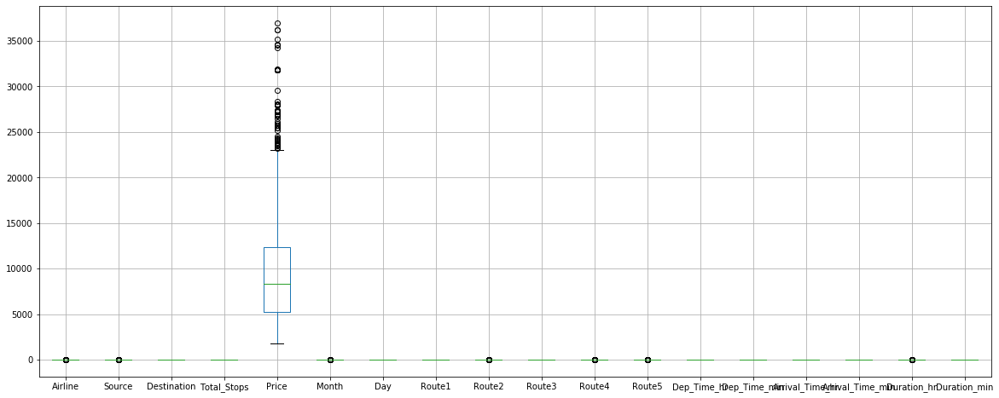

In [762]:
dtn.boxplot(figsize=[20,8])

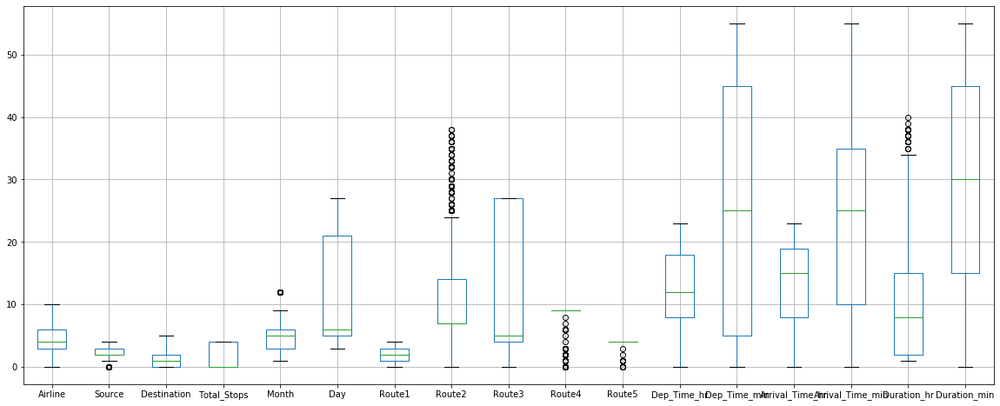

In [763]:
dts.boxplot(figsize=[20,8])

Outliers present in categorical columns so we should not remove that in both dataset, and from target column also. Therefore we keep as it is.

### Spliting theh data

In [766]:
x=dtn.drop('Price',axis=1)
x.head(3)

,Airline,Source,Destination,Total_Stops,Month,Day,Route1,Route2,Route3,Route4,Route5,Dep_Time_hr,Dep_Time_min,Arrival_Time_hr,Arrival_Time_min,Duration_hr,Duration_min
0,3.0,0.0,5.0,4.0,3,24,0.0,13.0,29.0,13.0,5.0,22,20,1,10,2.0,50.0
1,1.0,3.0,0.0,1.0,1,5,2.0,25.0,1.0,3.0,5.0,5,50,13,15,7.0,25.0
2,4.0,2.0,1.0,1.0,9,6,3.0,32.0,4.0,5.0,5.0,9,25,4,25,19.0,0.0


In [767]:
y=dtn['Price']
y.head(3)

0     3897.0
1     7662.0
2    13882.0
Name: Price, dtype: float64

In [768]:
from sklearn.preprocessing import MinMaxScaler
mm=MinMaxScaler()

In [769]:
x_new=mm.fit_transform(x)
x_new=pd.DataFrame(x_new,columns=x.columns)
x_new.head(3)

,Airline,Source,Destination,Total_Stops,Month,Day,Route1,Route2,Route3,Route4,Route5,Dep_Time_hr,Dep_Time_min,Arrival_Time_hr,Arrival_Time_min,Duration_hr,Duration_min
0,0.272727,0.00,1.0,1.00,0.181818,0.875000,0.00,0.295455,1.000000,1.000000,1.0,0.956522,0.363636,0.043478,0.181818,0.021739,0.909091
1,0.090909,0.75,0.0,0.25,0.000000,0.083333,0.50,0.568182,0.034483,0.230769,1.0,0.217391,0.909091,0.565217,0.272727,0.130435,0.454545
2,0.363636,0.50,0.2,0.25,0.727273,0.125000,0.75,0.727273,0.137931,0.384615,1.0,0.391304,0.454545,0.173913,0.454545,0.391304,0.000000


In [770]:
dts_new=mm.fit_transform(dts)
dts_new=pd.DataFrame(dts_new,columns=dts.columns)
dts_new.head()

,Airline,Source,Destination,Total_Stops,Month,Day,Route1,Route2,Route3,Route4,Route5,Dep_Time_hr,Dep_Time_min,Arrival_Time_hr,Arrival_Time_min,Duration_hr,Duration_min
0,0.4,0.50,0.2,0.0,0.454545,0.125000,0.75,0.184211,0.185185,1.0,1.0,0.739130,0.545455,0.173913,0.454545,0.230769,1.000000
1,0.3,0.75,0.0,0.0,1.000000,0.083333,0.50,0.763158,0.111111,1.0,1.0,0.260870,0.363636,0.434783,0.363636,0.076923,0.000000
2,0.4,0.50,0.2,0.0,0.363636,0.750000,0.75,0.184211,0.185185,1.0,1.0,0.826087,0.272727,0.826087,0.000000,0.564103,0.818182
3,0.6,0.50,0.2,0.0,0.363636,0.750000,0.75,0.184211,0.185185,1.0,1.0,0.347826,0.000000,0.913043,0.000000,0.307692,0.000000
4,0.0,0.00,0.4,1.0,0.454545,0.875000,0.00,0.342105,1.000000,1.0,1.0,1.000000,1.000000,0.086957,0.818182,0.025641,0.909091


In [771]:
x1=x_new.copy()

### Finding the best Random State

In [779]:
maxacc=0
maxrs=0

for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(x1,y,test_size=.20,random_state=i)
    dtr=DecisionTreeRegressor()
    dtr.fit(x_train,y_train)
    pred=dtr.predict(x_test)
    r2_sc=r2_score(y_test,pred)
    if r2_sc>maxacc:
        maxacc=r2_sc
        maxrs=i
print('best r2_sc is:',maxacc,' at random state', maxrs)

best r2_sc is: 0.768930827822505  at random state 152


In [781]:
x_train,x_test,y_train,y_test=train_test_split(x1,y,test_size=.20,random_state=152)

In [782]:
print(x_train.shape,x_test.shape,y_train.shape,y_test.shape)

(8545, 17) (2137, 17) (8545,) (2137,)


### Model Training

In [783]:
lr=LinearRegression()
ls=Lasso()
rd=Ridge()
el=ElasticNet()
rfr=RandomForestRegressor()
dtr=DecisionTreeRegressor()
svr=SVR()
knr=KNeighborsRegressor()
adr=AdaBoostRegressor()
xgr=XGBRegressor()

In [784]:
model=[lr,ls,rd,el,rfr,dtr,svr,knr,adr,xgr]

for i in model:
    print('model:',i)
    i.fit(x_train,y_train)
    pred=i.predict(x_test)
    print(r2_score(y_test,pred))
    print(np.sqrt(mean_squared_error(y_test,pred)))
    crs=cross_val_score(i,x1,y,cv=5)
    print(crs.mean())
    print('\n')

model: LinearRegression()
0.5494242333211943
2987.0516082083977
0.5195127444469583


model: Lasso()
0.5494417788348063
2986.9934494382805
0.5194490983314635


model: Ridge()
0.5494154767316394
2987.0806335796738
0.5195116937999379


model: ElasticNet()
0.2896335400884158
3750.593830607102
0.28090290555659114


model: RandomForestRegressor()
0.8503708226946978
1721.341165677026
0.816552871392442


model: DecisionTreeRegressor()
0.773912615537554
2115.9089509107966
0.7203907720738761


model: SVR()
0.1068870875732848
4205.445363922517
0.08903824635746482


model: KNeighborsRegressor()
0.7293509869790005
2315.05884620553
0.7076127038592469


model: AdaBoostRegressor()
0.5589294214429341
2955.376771671712
0.5675283083040877


model: XGBRegressor(base_score=None, booster=None, colsample_bylevel=None,
             colsample_bynode=None, colsample_bytree=None, gamma=None,
             gpu_id=None, importance_type='gain', interaction_constraints=None,
             learning_rate=None, max_delta

On the basis of r2_score and cv_score we select few model for gridsearch such as RandomForest,KNeighbors,AdaBoost,XBG

### Hyperparameter Tuning using GridSearchCV

In [785]:
# random forest regressor

par={'n_estimators':(100,150,200,230,250),'max_depth':np.arange(1,10),'max_features':['auto','sqrt','log2']}

gcv=GridSearchCV(rfr,par,cv=5)
gcv.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': array([1, 2, 3, 4, 5, 6, 7, 8, 9]),
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': (100, 150, 200, 230, 250)})

In [786]:
gcv.best_params_

{'max_depth': 9, 'max_features': 'auto', 'n_estimators': 150}

In [787]:
rf=RandomForestRegressor(n_estimators=150,max_depth=9,max_features='auto')
rf.fit(x_train,y_train)
predrf=rf.predict(x_test)
print(r2_score(y_test,predrf))
print(np.sqrt(mean_squared_error(y_test,predrf)))

0.8560267850608253
1688.494546295414


In [788]:
# kneighbors regressor

par={'n_neighbors':[3,5,7,9,11],'weights':['uniform','distance'],'algorithm':['auto','ball_tree','kd_tree','brute'],
    'n_jobs':[-1],'leaf_size':[8,9,10,11]}
gcv=GridSearchCV(knr,par,cv=5)
gcv.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=KNeighborsRegressor(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'leaf_size': [8, 9, 10, 11], 'n_jobs': [-1],
                         'n_neighbors': [3, 5, 7, 9, 11],
                         'weights': ['uniform', 'distance']})

In [789]:
gcv.best_params_

{'algorithm': 'ball_tree',
 'leaf_size': 8,
 'n_jobs': -1,
 'n_neighbors': 7,
 'weights': 'uniform'}

In [801]:
kn=KNeighborsRegressor(n_neighbors=5,weights='uniform',algorithm='auto',n_jobs=-1,leaf_size=8)
kn.fit(x_train,y_train)
predkn=kn.predict(x_test)
print(r2_score(y_test,predkn))
print(np.sqrt(mean_squared_error(y_test,predkn)))

0.7298205274461375
2313.049813056128


In [803]:
# adaboost regressor

par={'n_estimators':(20,40,50,100,120),'learning_rate':[0.001,0.02,0.01,0.1],'loss':['linear','square','exponential']}

gcv=GridSearchCV(adr,par,cv=5)
gcv.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=AdaBoostRegressor(),
             param_grid={'learning_rate': [0.001, 0.02, 0.01, 0.1],
                         'loss': ['linear', 'square', 'exponential'],
                         'n_estimators': (20, 40, 50, 100, 120)})

In [804]:
gcv.best_params_

{'learning_rate': 0.1, 'loss': 'exponential', 'n_estimators': 20}

In [812]:
ad=AdaBoostRegressor(n_estimators=30,loss='exponential',learning_rate=0.1)
ad.fit(x_train,y_train)
predad=ad.predict(x_test)
print(r2_score(y_test,predad))
print(np.sqrt(mean_squared_error(y_test,predad)))

0.6472298728114705
2643.045939371369


In [824]:
# xgb regressor

par={'n_estimators':[100,120,150,180,200],'max_depth':range(1,10),'eta':[0.001,0.01,0.1,0.2]}
gcv=GridSearchCV(xgr,par,cv=5)
gcv.fit(x_train,y_train)

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=0.5, booster='gbtree',
                                    colsample_bylevel=1, colsample_bynode=1,
                                    colsample_bytree=1, gamma=0, gpu_id=-1,
                                    importance_type='gain',
                                    interaction_constraints='',
                                    learning_rate=0.300000012, max_delta_step=0,
                                    max_depth=6, min_child_weight=1,
                                    missing=nan, monotone_constraints='()',
                                    n_estimators=100, n_jobs=8,
                                    num_parallel_tree=1, random_state=0,
                                    reg_alpha=0, reg_lambda=1,
                                    scale_pos_weight=1, subsample=1,
                                    tree_method='exact', validate_parameters=1,
                                    verbosity=None),
      

In [825]:
gcv.best_params_

{'eta': 0.001, 'max_depth': 5, 'n_estimators': 120}

In [823]:
xg=XGBRegressor(n_estimators=100,max_depth=8,eta=0.1)
xg.fit(x_train,y_train)
predxg=xg.predict(x_test)
print(r2_score(y_test,predxg))
print(np.sqrt(mean_squared_error(y_test,predxg)))

0.8745380840783369
1576.2125046743733


After hyper parameter tuning we can see that xgbregressor have highest r2_score and least RMSE value.So, it is our final model.

### Saving Our Final Model

In [826]:
import joblib

In [827]:
joblib.dump(xg,'flight_price_xgb.obj')

['flight_price_xgb.obj']

### Loading Our Model For Prediction

In [828]:
flight_price_xg=joblib.load('flight_price_xgb.obj')

In [829]:
# Final prediction with test dataset.

final_pred=flight_price_xg.predict(dts_new)
final_pred

array([11460.636 ,  5481.3643, 13881.854 , ..., 16847.46  , 14950.819 ,
        8679.387 ], dtype=float32)